In [1]:
%matplotlib inline
import glob
import json
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import os.path
import pandas as pd
from PIL import Image
import sklearn
import scipy.spatial
import scipy.stats

In [6]:
def prep_image_feature_data(data): 
    data.columns = [int(x.partition('.')[0].strip('/')) for x in data.columns]
    data = data.T
    data.index.name = 'image_id'
    return data

def prep_metadata(json_dir):
    image_data = {}
    price_data = {}
    for fn in glob.iglob(os.path.join(json_dir, '*.json')):
        with open(fn) as f:
            data = json.load(f)
            listing_id = data['slideshow_props']['listing']['id']
            price_data[listing_id] = data['pricing']['pricing_quote']['p3_display_rate']['amount']
            for photo in data['slideshow_props']['photos']:
                image_data[photo['id']] = {'listing_id' : listing_id, 'rank': photo['sort_order']}
                
    image_data = pd.DataFrame(image_data).T
    price_data = pd.Series(price_data, name='price')
    return image_data.join(price_data, 'listing_id')

In [21]:
def plot_images(fig, data, n_images=10, imsize=70, base_dir='/data/neon/airbnb/argentina_images'):
    data_sample = data.sample(n_images, axis=0)
    for i, row in data_sample.iterrows():
        try:
            im = Image.open(os.path.join(base_dir, '%i.jpg' % i))
        
            im.thumbnail((imsize, imsize))
        except IOError:
            continue
        imbox = OffsetImage(im)
        fig.get_axes()[0].add_artist(AnnotationBbox(imbox, row[:2], xycoords='data', frameon=False,
                                                    pad=0.0, box_alignment=(0.5, 0.5)))
        
def plot_images_evenly_in_space(features, base_dir='/data/neon/airbnb/argentina_images'):
    '''Plot the images to show so that we have roughly one in the middle of each grid cell'''
    fig = plt.figure(1, (15.0, 10.))
    plt.scatter(features.iloc[:,0], features.iloc[:,1])
    lim = fig.get_axes()[0].viewLim
    
    xrange = np.linspace(lim.xmin, lim.xmax, 18)
    yrange = np.linspace(lim.ymin, lim.ymax, 15)
    selected_features = []
    for x1, x2 in zip(xrange[:-1], xrange[1:]):
        for y1, y2 in zip(yrange[:-1], yrange[1:]):
            images_in_cell = ((features.iloc[:,0] > x1) & (features.iloc[:,0] < x2) & 
                              (features.iloc[:,1] > y1) & (features.iloc[:,1] < y2))
            images_in_cell = features.ix[images_in_cell]
            if images_in_cell.shape[0] == 0:
                continue
            selected_features.append(((images_in_cell.iloc[:,0] - ((x2+x1)/2)).abs() + 
                                      (images_in_cell.iloc[:,1] - (y1+y2)/2).abs()).argmin())
    images_to_show = features.ix[selected_features]
    plot_images(fig, images_to_show, n_images=images_to_show.shape[0], base_dir=base_dir)

In [7]:
argentina_valence = prep_image_feature_data(pd.read_pickle('/data/neon/airbnb/argentina_valence.pkl'))
argentina_inception = prep_image_feature_data(pd.read_pickle('/data/neon/airbnb/argentina_inception.pkl'))

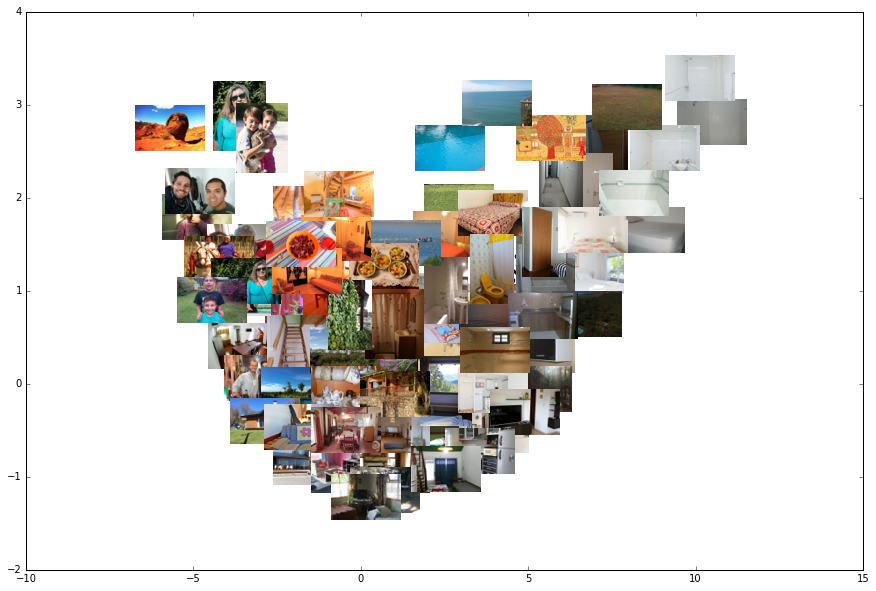

In [22]:
plot_images_evenly_in_space(argentina_valence)

In [25]:
def rank_images(corpus, query):
    dists = pd.DataFrame(scipy.spatial.distance.cdist(corpus, query), index=corpus.index,
                         columns=query.index)
    rank = dists.min(axis=1)
    return rank

def show_best_images(scores, base_dir='/data/neon/airbnb/argentina_images/'):
    '''Show top images from descending scores. The index will get me to the filename'''
    scores = scores.sort_values(ascending=True)
    
    fig = plt.figure(2, (20,16))
    grid = ImageGrid(fig, 111, nrows_ncols=(4, 5))
    i = 0
    for row in scores.index.tolist():
        im = Image.open(os.path.join(base_dir, '%s.jpg' % row))
        im.thumbnail((200, 200))
        grid[i].imshow(im)
        grid[i].set_xlim(0., 200.)
        grid[i].set_ylim(200., 0.)
        grid[i].axes.get_xaxis().set_ticks([])
        grid[i].axes.get_yaxis().set_ticks([])
        i += 1
        if i >= 20:
            break
    plt.show()

In [31]:
def combine_features(valence, inception, w=0.035):
    return pd.concat([valence[:100], w * inception], axis=1)

In [24]:
cabin_valence = prep_image_feature_data(pd.read_pickle('/data/neon/airbnb/cabin_images.pkl'))
cabin_inception = prep_image_feature_data(pd.read_pickle('/data/neon/airbnb/cabin_inception.pkl'))

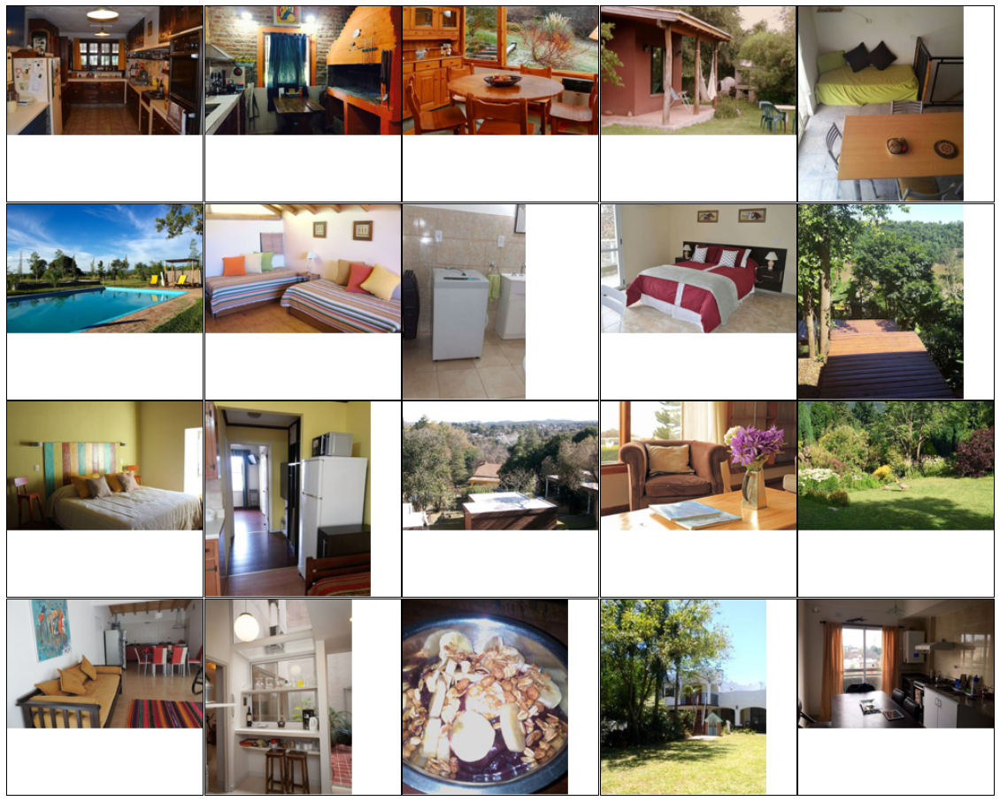

In [29]:
cabin_valence_ranks = rank_images(argentina_valence, cabin_valence)
show_best_images(cabin_valence_ranks)

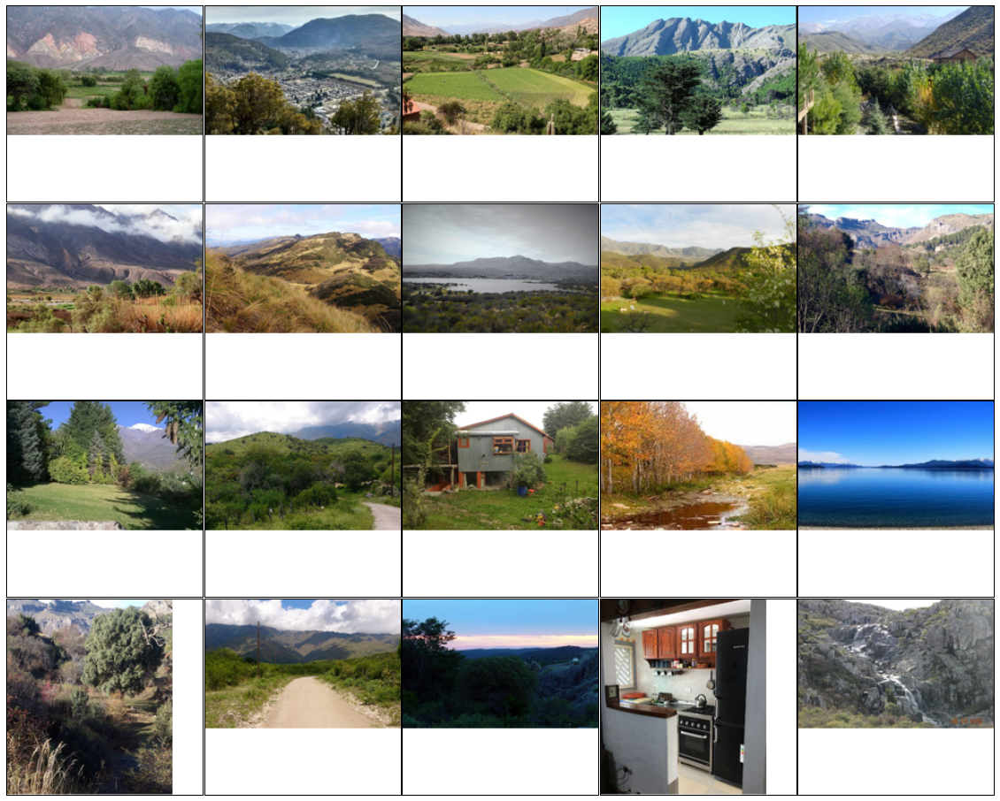

In [30]:
cabin_inception_ranks = rank_images(argentina_inception, cabin_inception)
show_best_images(cabin_inception_ranks)

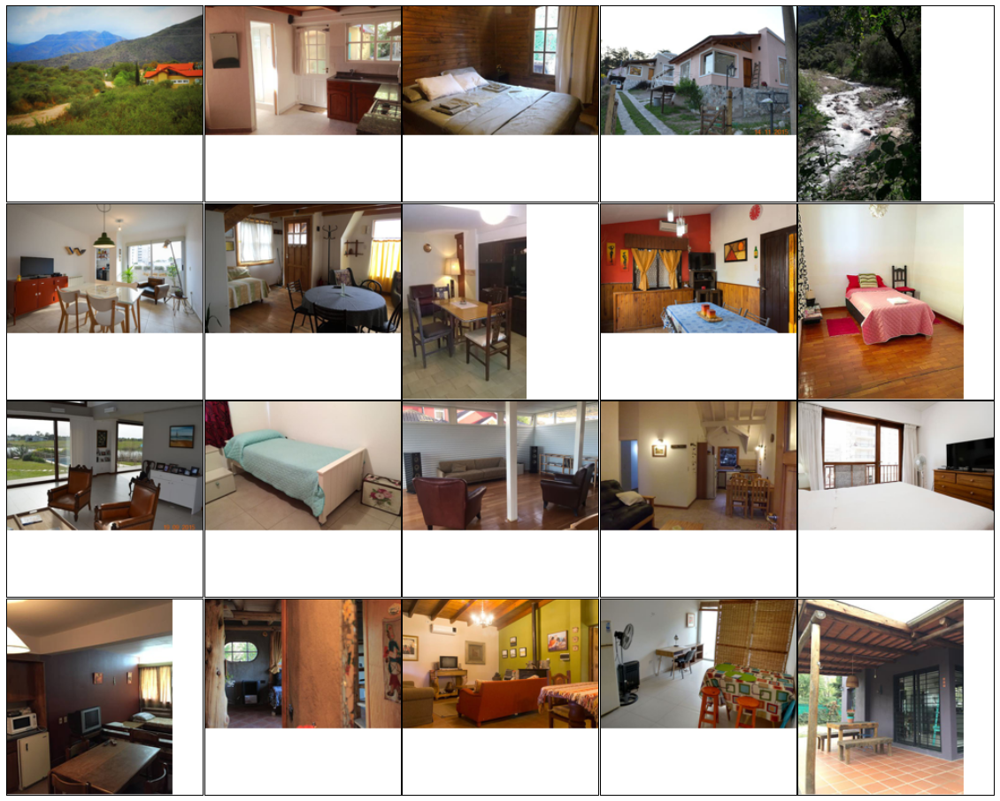

In [33]:
cabin_combined_ranks = rank_images(combine_features(argentina_valence, argentina_inception),
                                   combine_features(cabin_valence, cabin_inception))
show_best_images(cabin_combined_ranks)

In [34]:
paris_valence = prep_image_feature_data(pd.read_pickle('/data/neon/airbnb/paris_images.pkl'))
paris_inception = prep_image_feature_data(pd.read_pickle('/data/neon/airbnb/paris_inception.pkl'))

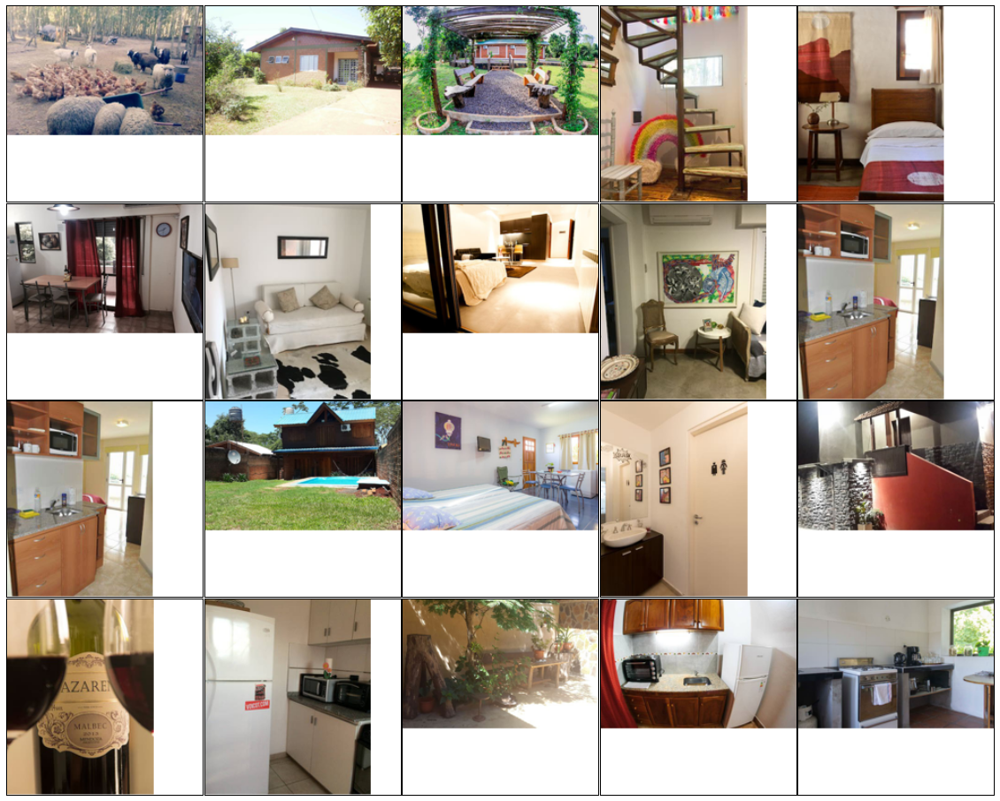

In [35]:
paris_valence_ranks = rank_images(argentina_valence, paris_valence)
show_best_images(paris_valence_ranks)

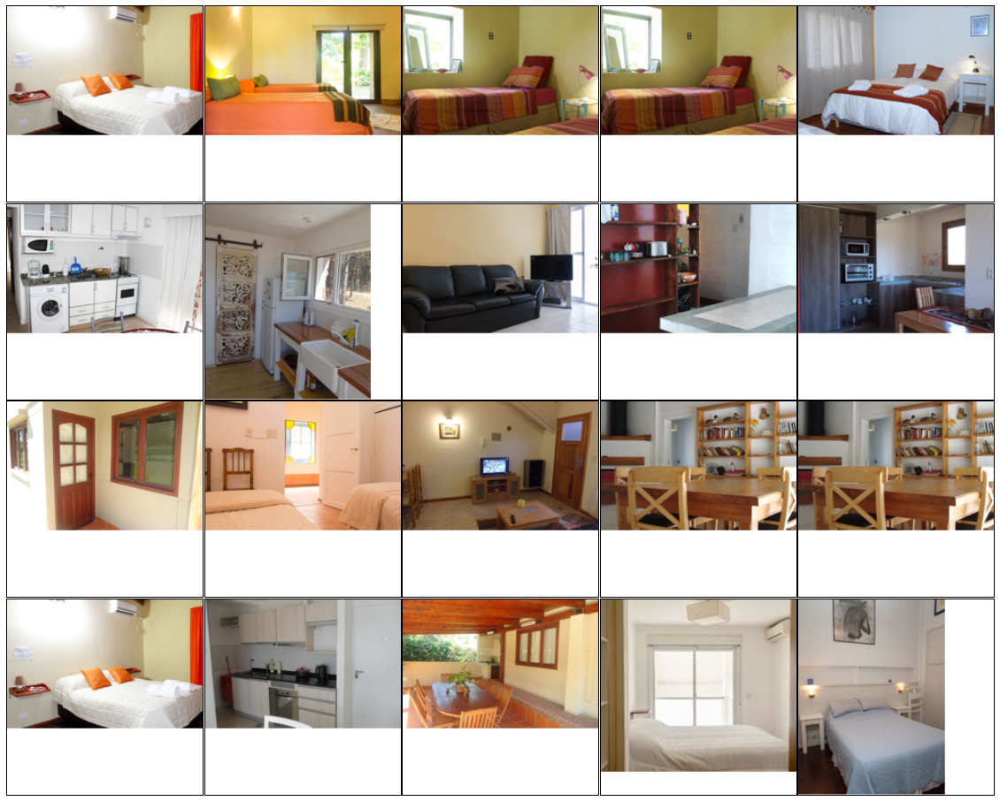

In [36]:
paris_inception_ranks = rank_images(argentina_inception, paris_inception)
show_best_images(paris_inception_ranks)

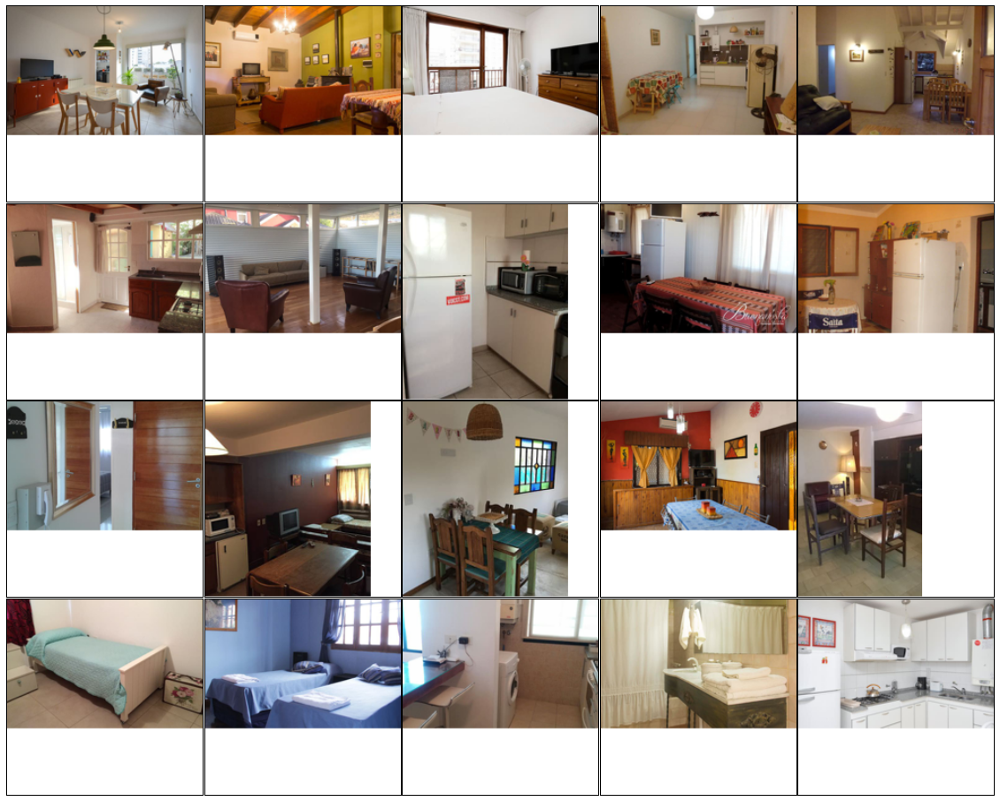

In [37]:
paris_combined_ranks = rank_images(combine_features(argentina_valence, argentina_inception),
                                   combine_features(paris_valence, paris_inception))
show_best_images(paris_combined_ranks)

In [38]:
japan_valence = prep_image_feature_data(pd.read_pickle('/data/neon/airbnb/japan_valence.pkl'))
japan_inception = prep_image_feature_data(pd.read_pickle('/data/neon/airbnb/japan_inception.pkl'))

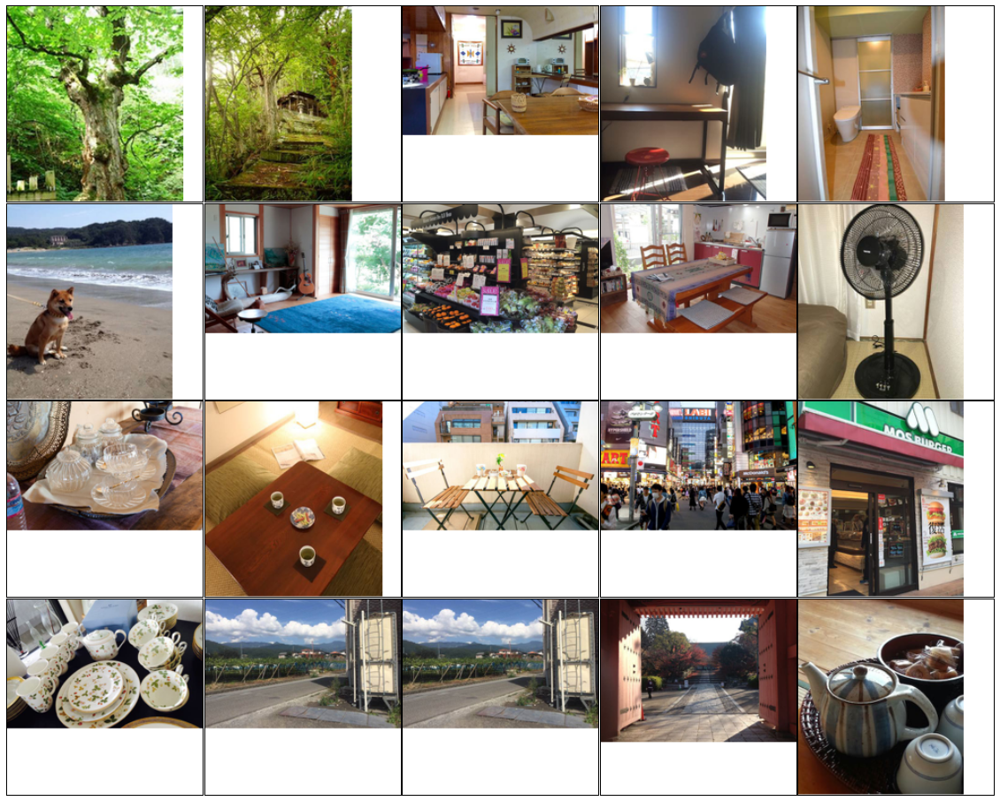

In [42]:
cabin_japan_valence_ranks = rank_images(japan_valence, cabin_valence)
show_best_images(cabin_japan_valence_ranks, base_dir='/data/neon/airbnb/japan_images')

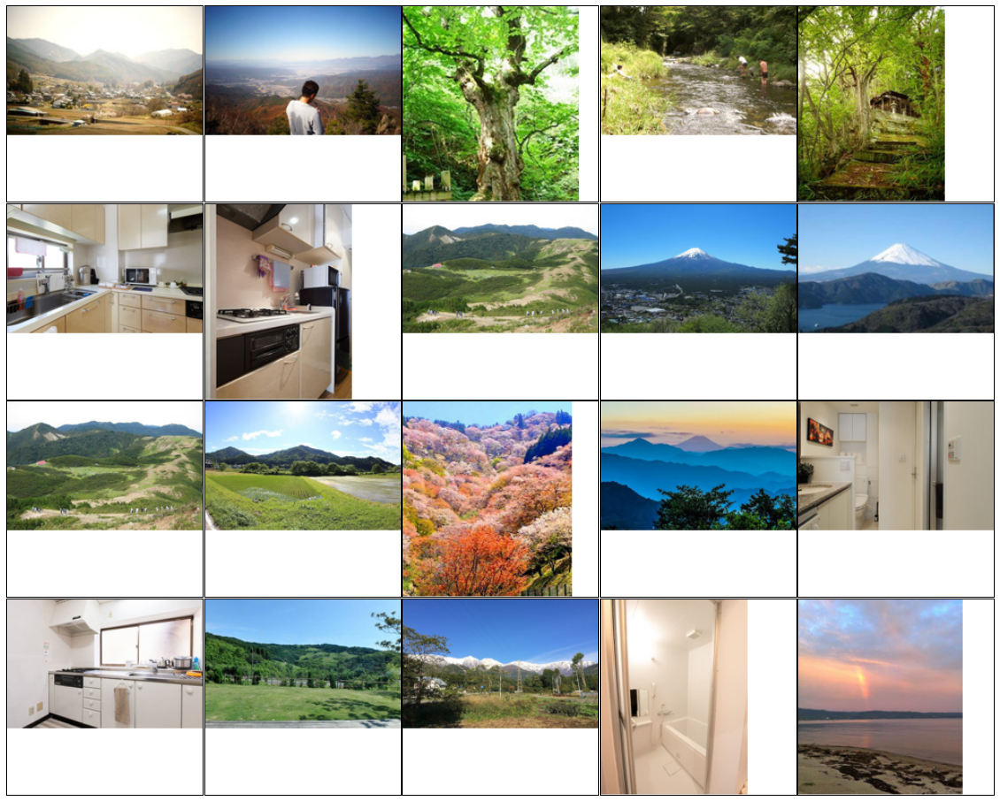

In [41]:
cabin_japan_inception_ranks = rank_images(japan_inception, cabin_inception)
show_best_images(cabin_japan_inception_ranks, base_dir='/data/neon/airbnb/japan_images')

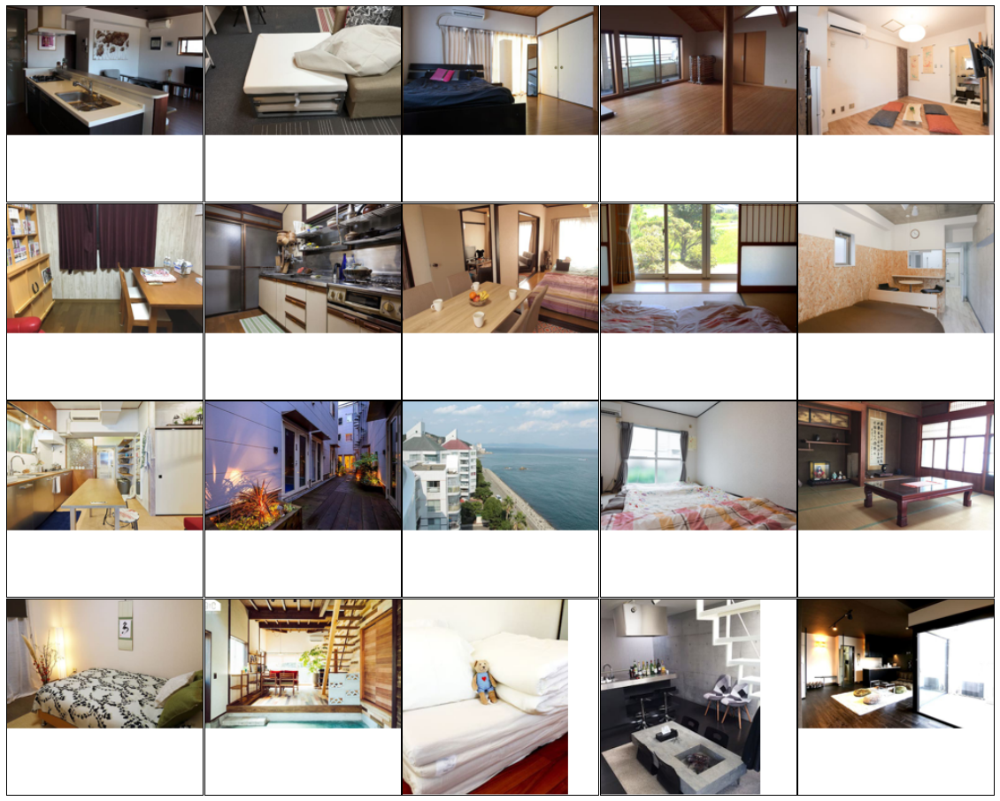

In [40]:
cabin_japan_combined_ranks = rank_images(
    combine_features(japan_valence, japan_inception),
    combine_features(cabin_valence, cabin_inception))
show_best_images(cabin_japan_combined_ranks, base_dir='/data/neon/airbnb/japan_images')

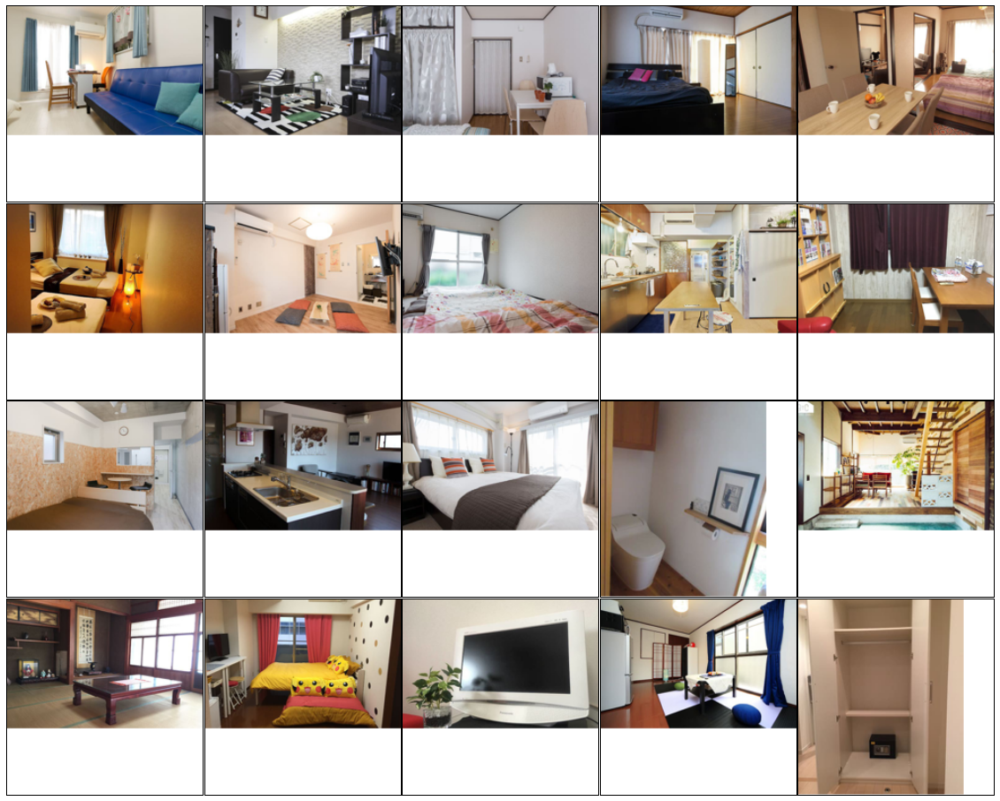

In [39]:
paris_japan_combined_ranks = rank_images(
    combine_features(japan_valence, japan_inception),
    combine_features(paris_valence, paris_inception))
show_best_images(paris_japan_combined_ranks, base_dir='/data/neon/airbnb/japan_images')